In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import pandas_profiling as pp
import seaborn as sns
sns.set()

In [2]:
Train = pd.read_csv('C:/Users/Jitesh Chandani/Desktop/train.csv')
Test = pd.read_csv('C:/Users/Jitesh Chandani/Desktop/test.csv')
Features = pd.read_csv('C:/Users/Jitesh Chandani/Desktop/features.csv')
Stores = pd.read_csv('C:/Users/Jitesh Chandani/Desktop/stores.csv')

In [3]:
Train.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday
0,1,1,2010-02-05,24924.50,False
1,1,1,2010-02-12,46039.49,True
2,1,1,2010-02-19,41595.55,False
3,1,1,2010-02-26,19403.54,False
4,1,1,2010-03-05,21827.90,False


In [4]:
Test.head()

,Store,Dept,Date,IsHoliday
0,1,1,2012-11-02,False
1,1,1,2012-11-09,False
2,1,1,2012-11-16,False
3,1,1,2012-11-23,True
4,1,1,2012-11-30,False


In [5]:
Features.head()

,Store,Date,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,IsHoliday
0,1,2010-02-05,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106,False
1,1,2010-02-12,38.51,2.548,NaN,NaN,NaN,NaN,NaN,211.242170,8.106,True
2,1,2010-02-19,39.93,2.514,NaN,NaN,NaN,NaN,NaN,211.289143,8.106,False
3,1,2010-02-26,46.63,2.561,NaN,NaN,NaN,NaN,NaN,211.319643,8.106,False
4,1,2010-03-05,46.50,2.625,NaN,NaN,NaN,NaN,NaN,211.350143,8.106,False


In [6]:
Stores.head()

,Store,Type,Size
0,1,A,151315
1,2,A,202307
2,3,B,37392
3,4,A,205863
4,5,B,34875


# Data Preparation

Merging the Dataset Train, Store and Features

Merging the Dataset Test, Store and Features

In [7]:
train_1=pd.merge(Train, Stores)
train=pd.merge(train_1, Features, on=["Store","Date",'IsHoliday'])
train.head(2)

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,1,2010-02-05,24924.50,False,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106
1,1,2,2010-02-05,50605.27,False,A,151315,42.31,2.572,NaN,NaN,NaN,NaN,NaN,211.096358,8.106


In [8]:
# Merging Test dataset
test_1=pd.merge(Test, Stores)
test=pd.merge(test_1, Features, on=["Store","Date",'IsHoliday'])
test.head(2)

,Store,Dept,Date,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,1,1,2012-11-02,False,A,151315,55.32,3.386,6766.44,5147.7,50.82,3639.9,2737.42,223.462779,6.573
1,1,2,2012-11-02,False,A,151315,55.32,3.386,6766.44,5147.7,50.82,3639.9,2737.42,223.462779,6.573


In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 421570 entries, 0 to 421569
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         421570 non-null  int64  
 1   Dept          421570 non-null  int64  
 2   Date          421570 non-null  object 
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  bool   
 5   Type          421570 non-null  object 
 6   Size          421570 non-null  int64  
 7   Temperature   421570 non-null  float64
 8   Fuel_Price    421570 non-null  float64
 9   MarkDown1     150681 non-null  float64
 10  MarkDown2     111248 non-null  float64
 11  MarkDown3     137091 non-null  float64
 12  MarkDown4     134967 non-null  float64
 13  MarkDown5     151432 non-null  float64
 14  CPI           421570 non-null  float64
 15  Unemployment  421570 non-null  float64
dtypes: bool(1), float64(10), int64(3), object(2)
memory usage: 51.9+ MB


In [10]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115064 entries, 0 to 115063
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Store         115064 non-null  int64  
 1   Dept          115064 non-null  int64  
 2   Date          115064 non-null  object 
 3   IsHoliday     115064 non-null  bool   
 4   Type          115064 non-null  object 
 5   Size          115064 non-null  int64  
 6   Temperature   115064 non-null  float64
 7   Fuel_Price    115064 non-null  float64
 8   MarkDown1     114915 non-null  float64
 9   MarkDown2     86437 non-null   float64
 10  MarkDown3     105235 non-null  float64
 11  MarkDown4     102176 non-null  float64
 12  MarkDown5     115064 non-null  float64
 13  CPI           76902 non-null   float64
 14  Unemployment  76902 non-null   float64
dtypes: bool(1), float64(9), int64(3), object(2)
memory usage: 13.3+ MB


In [11]:
import pandas_profiling 

pandas_profiling.ProfileReport(train)

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
profile_report = pandas_profiling.ProfileReport(train)
profile_report.to_file('profileReport.html')

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [13]:
# Train Numerical Data
train_num=train.select_dtypes(include=['float64', 'float32','int32','int64'])

# Train Categorical Data
train_cat = train.select_dtypes(include=['object', 'O'])

In [14]:
print('train Num Var: ' , train_num.columns.to_list())
print('\n','train Cat Var: ', train_cat.columns.to_list())

train Num Var:  ['Store', 'Dept', 'Weekly_Sales', 'Size', 'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment']

 train Cat Var:  ['Date', 'Type']


In [15]:
# Quick Function to check for missing Values
def  Missing_Inspection(x):
    return pd.Series([x.count(),x.isnull().sum()],index = ['N',"NMISS"])

#UDF to Create Numerical Data Audit Report
def  num_var_summary(x):
    return pd.Series([x.count(),x.isnull().sum(),x.sum(),x.mean(),x.median(),x.std(),x.var(),x.min(),x.dropna().quantile(0.01),x.dropna().quantile(0.05),x.dropna().quantile(0.10),x.dropna().quantile(0.25),x.dropna().quantile(0.50),x.dropna().quantile(0.75),x.dropna().quantile(0.90),x.dropna().quantile(0.95),x.dropna().quantile(0.99),x.max()],
                    index = ['N',"NMISS","SUM",'MEAN','MEDIAN','STD','VAR','MIN','P1','P5','P10','P25','P50','P75','P90','P95','P99','MAX'])

# UDF to create categorical data audit report
def cat_summary(x):
    return pd.Series([x.count(),x.isnull().sum(),x.value_counts()], index=['N','NMISS','ColumnsName'])

In [16]:
# Numerical Summary for Train Data Set
num_summary = train_num.apply(num_var_summary).T
num_summary.to_csv('num_var_summ_train.csv')
num_summary

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
Store,421570.0,0.0,9.359084e+06,22.200546,22.00000,12.785297,1.634638e+02,1.000,1.000000,3.000000,5.000000,11.000000,22.00000,33.000000,40.000000,43.000000,45.000000,45.000000
Dept,421570.0,0.0,1.865882e+07,44.260317,37.00000,30.492054,9.297654e+02,1.000,1.000000,4.000000,7.000000,18.000000,37.00000,74.000000,92.000000,95.000000,98.000000,99.000000
Weekly_Sales,421570.0,0.0,6.737219e+09,15981.258123,7612.03000,22711.183519,5.157979e+08,-4988.940,5.000000,59.974500,291.097000,2079.650000,7612.03000,20205.852500,42845.673000,61201.951000,106479.586000,693099.360000
Size,421570.0,0.0,5.764039e+10,136727.915739,140167.00000,60980.583328,3.718632e+09,34875.000,34875.000000,39690.000000,39910.000000,93638.000000,140167.00000,202505.000000,204184.000000,206302.000000,219622.000000,219622.000000
Temperature,421570.0,0.0,2.533217e+07,60.090059,62.09000,18.447931,3.403262e+02,-2.060,18.300000,27.310000,33.980000,46.680000,62.09000,74.280000,83.580000,87.270000,92.810000,100.140000
Fuel_Price,421570.0,0.0,1.416908e+06,3.361027,3.45200,0.458515,2.102356e-01,2.472,2.565000,2.653000,2.720000,2.933000,3.45200,3.738000,3.917000,4.029000,4.202000,4.468000
MarkDown1,150681.0,270889.0,1.091898e+09,7246.420196,5347.45000,8291.221345,6.874435e+07,0.270,17.760000,149.190000,375.200000,2240.270000,5347.45000,9210.900000,15282.470000,21801.350000,41524.030000,88646.760000
MarkDown2,111248.0,310322.0,3.709708e+08,3334.628621,192.00000,9475.357325,8.978240e+07,-265.760,-0.990000,1.950000,6.980000,41.600000,192.00000,1926.940000,8549.740000,16497.470000,50366.600000,104519.540000
MarkDown3,137091.0,284479.0,1.973317e+08,1439.421384,24.60000,9623.078290,9.260364e+07,-29.100,0.060000,0.650000,1.650000,5.080000,24.60000,103.990000,400.090000,1059.900000,63143.290000,141630.610000
MarkDown4,134967.0,286603.0,4.566161e+08,3383.168256,1481.31000,6292.384031,3.959410e+07,0.220,3.970000,28.760000,108.710000,504.220000,1481.31000,3595.040000,7871.420000,12645.960000,35785.260000,67474.850000


In [17]:
# train Categorical Summary
cat_summary_train = train_cat.apply(cat_summary).T
cat_summary_train.to_csv('cat_summ_train.csv')
cat_summary_train

,N,NMISS,ColumnsName
Date,421570,0,2011-12-23 3027 2011-11-25 3021 2011-12-...
Type,421570,0,A 215478 B 163495 C 42597 Name: Type...


# Splitting Categorical and Numerical Data for test dataset

In [18]:
#Test Numerical Data
test_num=test.select_dtypes(include=['float64', 'float32','int32','int64'])

#Test Categorical Data
test_cat = test.select_dtypes(include=['object', 'O'])

In [19]:
num_summary_test = test_num.apply(num_var_summary).T
num_summary_test.to_csv('num_var_summ_test.csv')
num_summary_test

,N,NMISS,SUM,MEAN,MEDIAN,STD,VAR,MIN,P1,P5,P10,P25,P50,P75,P90,P95,P99,MAX
Store,115064.0,0.0,2.558817e+06,22.238207,22.000000,12.809930,1.640943e+02,1.000000,1.000000,3.0000,5.000000,11.000000,22.000000,33.000000,40.000000,43.000000,45.000000,45.000000
Dept,115064.0,0.0,5.101883e+06,44.339524,37.000000,30.656410,9.398155e+02,1.000000,1.000000,4.0000,7.000000,18.000000,37.000000,74.000000,92.000000,95.000000,98.000000,99.000000
Size,115064.0,0.0,1.570597e+10,136497.688921,140167.000000,61106.926438,3.734056e+09,34875.000000,34875.000000,39690.0000,39910.000000,93638.000000,140167.000000,202505.000000,204184.000000,206302.000000,219622.000000,219622.000000
Temperature,115064.0,0.0,6.206760e+06,53.941804,54.470000,18.724153,3.505939e+02,-7.290000,11.440000,23.9800,29.970000,39.820000,54.470000,67.350000,79.480000,83.820000,92.140000,101.950000
Fuel_Price,115064.0,0.0,4.121070e+05,3.581546,3.606000,0.239442,5.733244e-02,2.872000,2.957000,3.1610,3.227000,3.431000,3.606000,3.766000,3.866000,3.951000,4.079000,4.125000
MarkDown1,114915.0,149.0,8.836063e+08,7689.216439,4842.290000,10698.760716,1.144635e+08,-2781.450000,20.840000,189.4900,457.660000,1966.460000,4842.290000,9439.140000,15325.040000,23140.880000,65757.570000,103184.980000
MarkDown2,86437.0,28627.0,3.227602e+08,3734.051729,742.590000,8323.495014,6.928057e+07,-35.740000,0.020000,6.1400,25.770000,180.350000,742.590000,2735.670000,9277.290000,22671.670000,42920.210000,71074.170000
MarkDown3,105235.0,9829.0,2.528890e+08,2403.088666,78.260000,13767.939313,1.895562e+08,-179.260000,0.150000,1.1800,3.100000,15.100000,78.260000,272.580000,698.930000,2361.570000,86476.660000,149483.310000
MarkDown4,102176.0,12888.0,3.429250e+08,3356.219071,840.940000,7570.501545,5.731249e+07,0.220000,2.610000,16.9600,37.360000,155.460000,840.940000,3096.920000,7674.410000,14191.010000,44739.280000,65344.640000
MarkDown5,115064.0,0.0,4.513594e+08,3922.681189,2390.430000,19445.150745,3.781139e+08,-185.170000,269.300000,540.8900,770.883000,1309.300000,2390.430000,4227.270000,6966.340000,9316.710000,18599.300000,771448.100000


# Correlation

In [20]:
train_corr = pd.DataFrame(train.corr())
train_corr.to_csv('train_data_corr.csv')
train_corr

,Store,Dept,Weekly_Sales,IsHoliday,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
Store,1.000000,0.024004,-0.085195,-0.000548,-0.182881,-0.050097,0.065290,-0.119588,-0.035173,-0.031556,-0.009941,-0.026634,-0.211088,0.208552
Dept,0.024004,1.000000,0.148032,0.000916,-0.002966,0.004437,0.003572,-0.002426,0.000290,0.001784,0.004257,0.000109,-0.007477,0.007837
Weekly_Sales,-0.085195,0.148032,1.000000,0.012774,0.243828,-0.002312,-0.000120,0.085251,0.024130,0.060385,0.045414,0.090362,-0.020921,-0.025864
IsHoliday,-0.000548,0.000916,0.012774,1.000000,0.000593,-0.155949,-0.078281,-0.035586,0.334818,0.427960,-0.000562,-0.053719,-0.001944,0.010460
Size,-0.182881,-0.002966,0.243828,0.000593,1.000000,-0.058313,0.003361,0.345673,0.108827,0.048913,0.168196,0.304575,-0.003314,-0.068238
Temperature,-0.050097,0.004437,-0.002312,-0.155949,-0.058313,1.000000,0.143859,-0.040594,-0.323927,-0.096880,-0.063947,-0.017544,0.182112,0.096730
Fuel_Price,0.065290,0.003572,-0.000120,-0.078281,0.003361,0.143859,1.000000,0.061371,-0.220895,-0.102092,-0.044986,-0.128065,-0.164210,-0.033853
MarkDown1,-0.119588,-0.002426,0.085251,-0.035586,0.345673,-0.040594,0.061371,1.000000,0.024486,-0.108115,0.819238,0.160257,-0.055558,0.050285
MarkDown2,-0.035173,0.000290,0.024130,0.334818,0.108827,-0.323927,-0.220895,0.024486,1.000000,-0.050108,-0.007768,-0.007440,-0.039534,0.020940
MarkDown3,-0.031556,0.001784,0.060385,0.427960,0.048913,-0.096880,-0.102092,-0.108115,-0.050108,1.000000,-0.071095,-0.026467,-0.023590,0.012818


<AxesSubplot:>

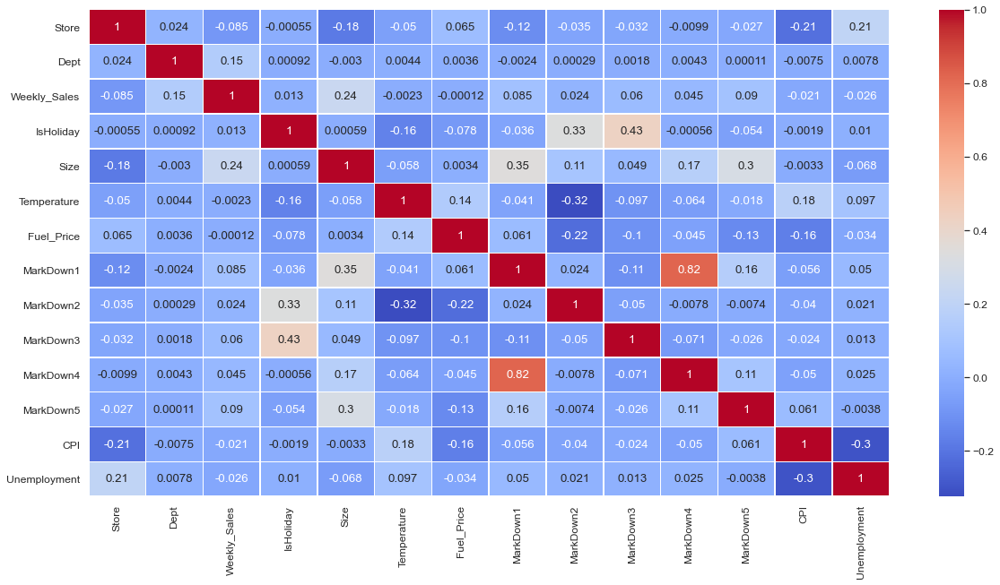

In [21]:
sns.set(rc={'figure.figsize':(20,10)}, font_scale=1.1)
sns.heatmap(train.corr(),linewidths=0.5,annot=True,cmap='coolwarm')

In [22]:
test_corr = pd.DataFrame(test.corr())
test_corr.to_csv('test_data_corr.csv')
test_corr

,Store,Dept,IsHoliday,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
Store,1.000000,0.019627,-0.001166,-0.186845,-0.043495,0.153425,-0.091707,-0.041370,-0.025177,0.010331,0.010419,-0.214872,0.250321
Dept,0.019627,1.000000,0.001249,0.001502,0.003970,0.000554,-0.002353,0.001292,0.000247,0.002510,0.000776,-0.006336,0.004087
IsHoliday,-0.001166,0.001249,1.000000,-0.000443,-0.187428,-0.126443,0.355257,0.265402,0.496062,0.289700,-0.019386,-0.001475,0.010288
Size,-0.186845,0.001502,-0.000443,1.000000,-0.061256,0.055088,0.309614,0.157526,0.050088,0.155448,0.103681,-0.002916,-0.001988
Temperature,-0.043495,0.003970,-0.187428,-0.061256,1.000000,0.073938,-0.168899,-0.324280,-0.049771,-0.059583,0.003937,0.280861,0.022136
Fuel_Price,0.153425,0.000554,-0.126443,0.055088,0.073938,1.000000,0.083320,-0.161963,-0.005827,0.034199,0.012722,-0.465721,0.417126
MarkDown1,-0.091707,-0.002353,0.355257,0.309614,-0.168899,0.083320,1.000000,0.001777,-0.090085,0.804449,0.061714,-0.028729,0.019241
MarkDown2,-0.041370,0.001292,0.265402,0.157526,-0.324280,-0.161963,0.001777,1.000000,-0.063757,-0.101784,-0.014159,-0.059350,-0.000547
MarkDown3,-0.025177,0.000247,0.496062,0.050088,-0.049771,-0.005827,-0.090085,-0.063757,1.000000,-0.059576,-0.015305,-0.022021,0.006298
MarkDown4,0.010331,0.002510,0.289700,0.155448,-0.059583,0.034199,0.804449,-0.101784,-0.059576,1.000000,0.024163,-0.056629,0.021993


<AxesSubplot:>

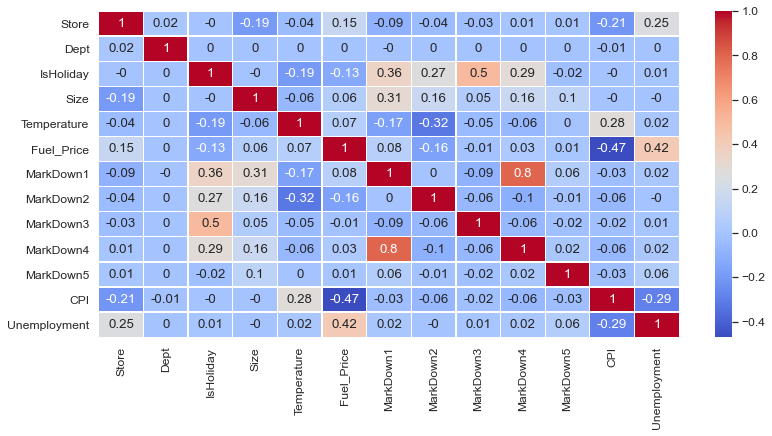

In [23]:
sns.set(rc={'figure.figsize':(13,6)}, font_scale=1.1)
sns.heatmap((test.corr()).round(2),linewidths=0.25,annot=True,cmap='coolwarm')

# Data Exploratory Analysis

<AxesSubplot:>

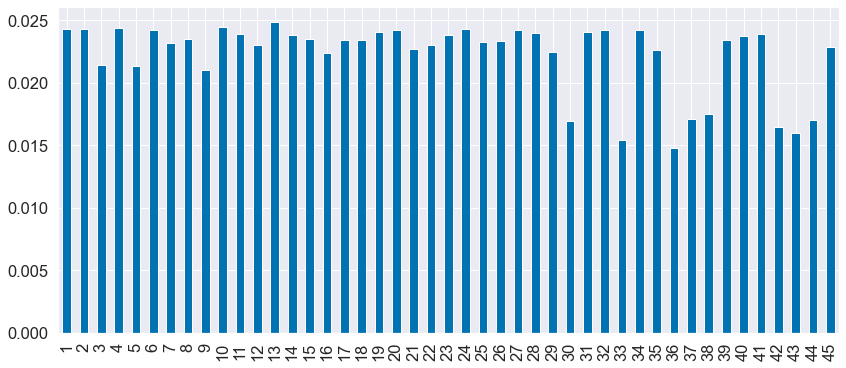

In [101]:
sns.set(rc={'figure.figsize':(14,6)}, palette="colorblind", font_scale=1.5)
train['Store'].value_counts(normalize=True).plot(kind = 'bar')

# Distribution of Weekly sales i.e Y - variable

C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Weekly_Sales', ylabel='Density'>

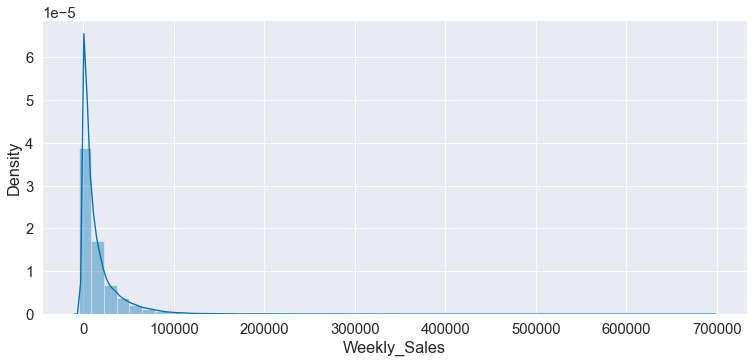

In [102]:
plt.figure(dpi=65)
sns.distplot(train.Weekly_Sales)

# Outlier Treatment

C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='Weekly_Sales'>

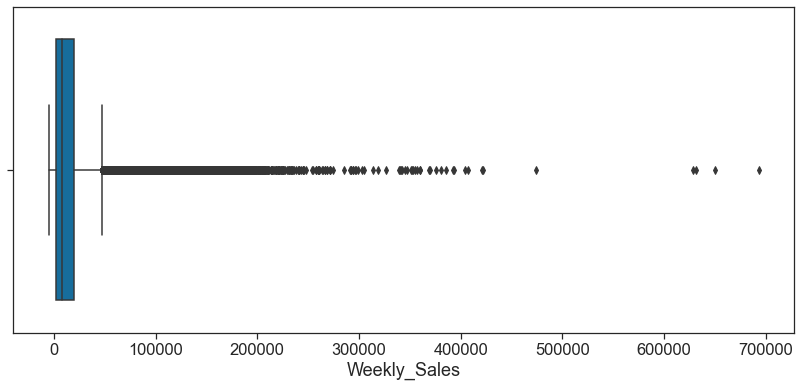

In [106]:
sns.boxplot(train.Weekly_Sales)

In [107]:
train['Weekly_Sales'] = np.where(train['Weekly_Sales']>100000,100000,train['Weekly_Sales'])


C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Weekly_Sales', ylabel='Density'>

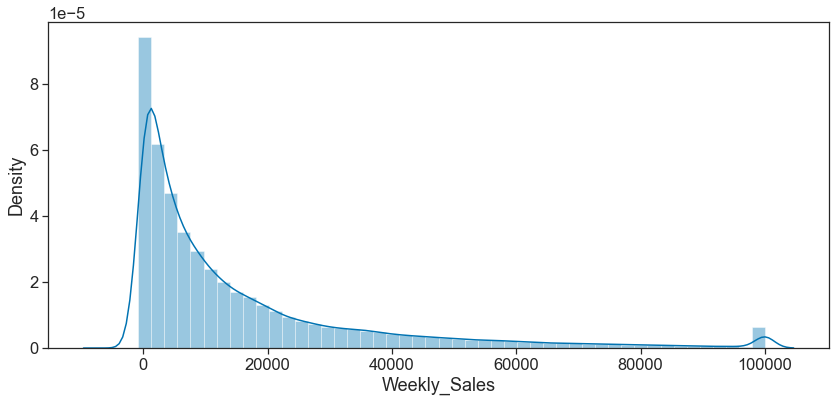

In [108]:
sns.distplot(train.Weekly_Sales)


# Sales based Store

<AxesSubplot:>

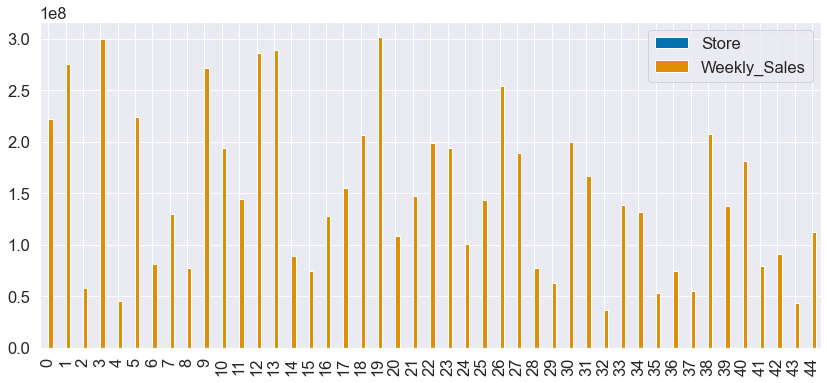

In [103]:
train.groupby('Store').agg({'Weekly_Sales':"sum"}).reset_index().plot(kind='bar')


# Sales based on type

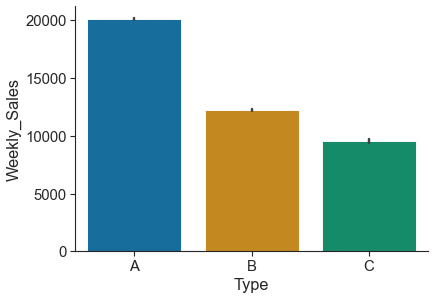

In [104]:
plt.figure(figsize=(7,5),dpi=65)
sns.set_style('ticks')
sns.barplot(y=train["Weekly_Sales"],x=train["Type"],palette='colorblind')
sns.despine()

# Missing Value Treatment

In [110]:
train.apply(Missing_Inspection).T


,N,NMISS
Store,421570,0
Dept,421570,0
Date,421570,0
Weekly_Sales,421570,0
IsHoliday,421570,0
Type,421570,0
Size,421570,0
Temperature,421570,0
Fuel_Price,421570,0
MarkDown1,150681,270889


In [36]:
test.apply(Missing_Inspection).T


,N,NMISS
Store,115064,0
Dept,115064,0
Date,115064,0
IsHoliday,115064,0
Type,115064,0
Size,115064,0
Temperature,115064,0
Fuel_Price,115064,0
MarkDown1,114915,149
MarkDown2,86437,28627


# Negative Value Inspection

In [37]:
print(train_num.apply(num_var_summary).T['MIN']<0)
print('\n','.><.'*7)
print(test_num.apply(num_var_summary).T['MIN']<0)

Store           False
Dept            False
Weekly_Sales     True
Size            False
Temperature      True
Fuel_Price      False
MarkDown1       False
MarkDown2        True
MarkDown3        True
MarkDown4       False
MarkDown5       False
CPI             False
Unemployment    False
Name: MIN, dtype: bool

 .><..><..><..><..><..><..><.
Store           False
Dept            False
Size            False
Temperature      True
Fuel_Price      False
MarkDown1        True
MarkDown2        True
MarkDown3        True
MarkDown4       False
MarkDown5        True
CPI             False
Unemployment    False
Name: MIN, dtype: bool


In [38]:
#1 negative Value Cleaning for both train and test dataset
train.loc[train['Weekly_Sales'] < 0 ,'Weekly_Sales'] = 0
train.loc[train['MarkDown2'] < 0 ,'MarkDown2'] = 0
train.loc[train['MarkDown3'] < 0, 'MarkDown3'] = 0
test.loc[test['MarkDown1'] < 0 ,'MarkDown1']= 0
test.loc[test['MarkDown2'] < 0, 'MarkDown2'] = 0
test.loc[test['MarkDown3'] < 0 ,'MarkDown3']= 0
test.loc[test['MarkDown5'] < 0 ,'MarkDown5']= 0

In [39]:
#2 Missing Value treatment for "test" Other than Markdowns
test['CPI'] = test.groupby(['Dept'])['CPI'].transform(lambda x: x.fillna(x.mean()))
test['Unemployment'] = test.groupby(['Dept'])['Unemployment'].transform(lambda x: x.fillna(x.mean()))

In [40]:
#3 Now we can Fill NAN Markdowns with 0
train = train.fillna(0)
test = test.fillna(0)

In [41]:
train.apply(Missing_Inspection).T


,N,NMISS
Store,421570,0
Dept,421570,0
Date,421570,0
Weekly_Sales,421570,0
IsHoliday,421570,0
Type,421570,0
Size,421570,0
Temperature,421570,0
Fuel_Price,421570,0
MarkDown1,421570,0


In [42]:
test.apply(Missing_Inspection).T


,N,NMISS
Store,115064,0
Dept,115064,0
Date,115064,0
IsHoliday,115064,0
Type,115064,0
Size,115064,0
Temperature,115064,0
Fuel_Price,115064,0
MarkDown1,115064,0
MarkDown2,115064,0


C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='Weekly_Sales', ylabel='Density'>

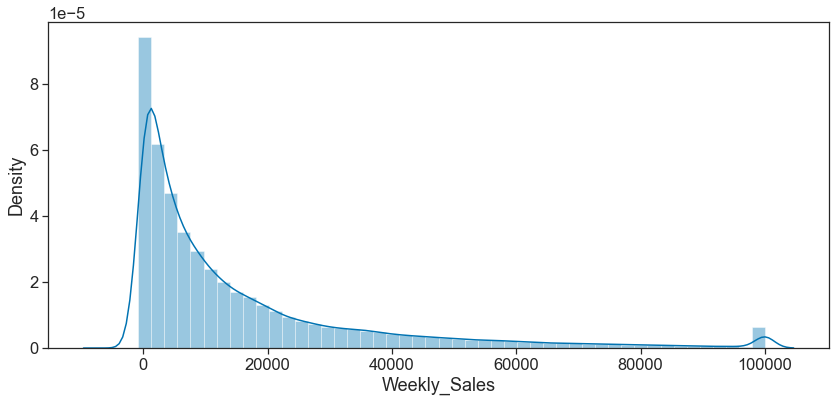

In [111]:
sns.distplot(train.Weekly_Sales)


# Feature Extraction

Creating a new feature in training dataset

In [44]:
train['Temperature'] = (train['Temperature'] - 32) * 5/9
test['Temperature'] = (test['Temperature'] - 32) * 5/9

In [45]:
train["Date"].dtype


dtype('O')

In [46]:
train['Date'] = pd.to_datetime(train['Date'])
test['Date'] = pd.to_datetime(test['Date'])

In [47]:
#### Extracting date features
train["Date"]=pd.to_datetime(train["Date"])
train["Day"]=train['Date'].dt.day
train["Week"]=train['Date'].dt.week
train["Month"]=train['Date'].dt.month
train["Year"]=train['Date'].dt.year

test["Day"]=test['Date'].dt.day
test["Week"]=test['Date'].dt.week
test["Month"]=test['Date'].dt.month
test["Year"]=test['Date'].dt.year

C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  after removing the cwd from sys.path.
C:\Users\Jitesh Chandani\anaconda3\lib\site-packages\ipykernel_launcher.py:9: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  if __name__ == '__main__':


In [48]:
#SUPERBOWL DATES
s_1=np.datetime64('2010-02-12')
s_2=np.datetime64('2011-02-11')
s_3=np.datetime64('2012-02-10')
s_4=np.datetime64('2013-02-08')

#labor day
l_1=np.datetime64('2010-09-10')
l_2=np.datetime64('2011-09-09')
l_3=np.datetime64('2012-09-07')
l_4=np.datetime64('2013-09-06')

#thanksgiving
t_1=np.datetime64('2010-11-26')
t_2=np.datetime64('2011-11-25')
t_3=np.datetime64('2012-11-23')
t_4=np.datetime64('2013-11-29')

#christams day
c_1=np.datetime64('2010-12-31')
c_2=np.datetime64('2011-12-30')
c_3=np.datetime64('2012-12-28')
c_4=np.datetime64('2013-12-27')

In [49]:
#Creating new variables on train data

train['Superbowl']=np.where(((train.Date==s_1) | (train.Date==s_2) |
                                  (train.Date==s_3) | (train.Date==s_4)),1,0)

train['labor']= np.where(((train.Date==l_1) | (train.Date==l_2) |
                                  (train.Date==l_3) | (train.Date==l_4)),1,0)

train['thanksgiving']=np.where(((train.Date==t_1) | (train.Date==t_2) |
                                  (train.Date==t_3) | (train.Date==t_4)),1,0)

train['christmas']=np.where(((train.Date==c_1) | (train.Date==c_2) |
                             (train.Date==c_3) | (train.Date==c_4)),1,0)

train.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,...,CPI,Unemployment,Day,Week,Month,Year,Superbowl,labor,thanksgiving,christmas
0,1,1,2010-02-05,24924.50,False,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
1,1,2,2010-02-05,50605.27,False,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
2,1,3,2010-02-05,13740.12,False,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
3,1,4,2010-02-05,39954.04,False,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
4,1,5,2010-02-05,32229.38,False,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0


In [50]:
    #Creating new variables on test data
    test['Superbowl']=np.where(((test.Date==s_1) | (test.Date==s_2) |
                                      (test.Date==s_3) | (test.Date==s_4)),1,0)

    test['labor']= np.where(((test.Date==l_1) | (test.Date==l_2) |
                                      (test.Date==l_3) | (test.Date==l_4)),1,0)

    test['thanksgiving']=np.where(((test.Date==t_1) | (test.Date==t_2) |
                                      (test.Date==t_3) | (test.Date==t_4)),1,0)

    test['christmas']=np.where(((test.Date==c_1) | (test.Date==c_2) |
                                 (test.Date==c_3) | (test.Date==c_4)),1,0)

    test.head()

,Store,Dept,Date,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,...,CPI,Unemployment,Day,Week,Month,Year,Superbowl,labor,thanksgiving,christmas
0,1,1,2012-11-02,False,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
1,1,2,2012-11-02,False,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
2,1,3,2012-11-02,False,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
3,1,4,2012-11-02,False,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
4,1,5,2012-11-02,False,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0


In [51]:
#converting IsHoliday variables from true/false to 1/0 on train data
train['IsHoliday']=np.where((train.IsHoliday==True),1,0)
train.head()

,Store,Dept,Date,Weekly_Sales,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,...,CPI,Unemployment,Day,Week,Month,Year,Superbowl,labor,thanksgiving,christmas
0,1,1,2010-02-05,24924.50,0,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
1,1,2,2010-02-05,50605.27,0,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
2,1,3,2010-02-05,13740.12,0,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
3,1,4,2010-02-05,39954.04,0,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0
4,1,5,2010-02-05,32229.38,0,A,151315,5.727778,2.572,0.0,...,211.096358,8.106,5,5,2,2010,0,0,0,0


In [52]:
#converting IsHoliday variables from true/false to 1/0 on test data
test['IsHoliday']=np.where((test.IsHoliday==True),1,0)
test.head()

,Store,Dept,Date,IsHoliday,Type,Size,Temperature,Fuel_Price,MarkDown1,MarkDown2,...,CPI,Unemployment,Day,Week,Month,Year,Superbowl,labor,thanksgiving,christmas
0,1,1,2012-11-02,0,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
1,1,2,2012-11-02,0,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
2,1,3,2012-11-02,0,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
3,1,4,2012-11-02,0,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0
4,1,5,2012-11-02,0,A,151315,12.955556,3.386,6766.44,5147.7,...,223.462779,6.573,2,44,11,2012,0,0,0,0


# Changing the values of Isholiday Columns according to special holidays

In [53]:
train['IsHoliday']=train['IsHoliday']|train['Superbowl']|train['labor']|train['thanksgiving']|train['christmas']
test['IsHoliday']=test['IsHoliday']|test['Superbowl']|test['labor']|test['thanksgiving']|test['christmas']

# Dropping the extra columns as they now are not useful

In [54]:
unwanted=['Superbowl', 'labor', 'thanksgiving', 'christmas']
train.drop(unwanted,inplace=True,axis=1)
test.drop(unwanted,inplace=True,axis=1)

In [55]:
train=pd.get_dummies(train, drop_first=True)
test=pd.get_dummies(test,drop_first=True)

<AxesSubplot:>

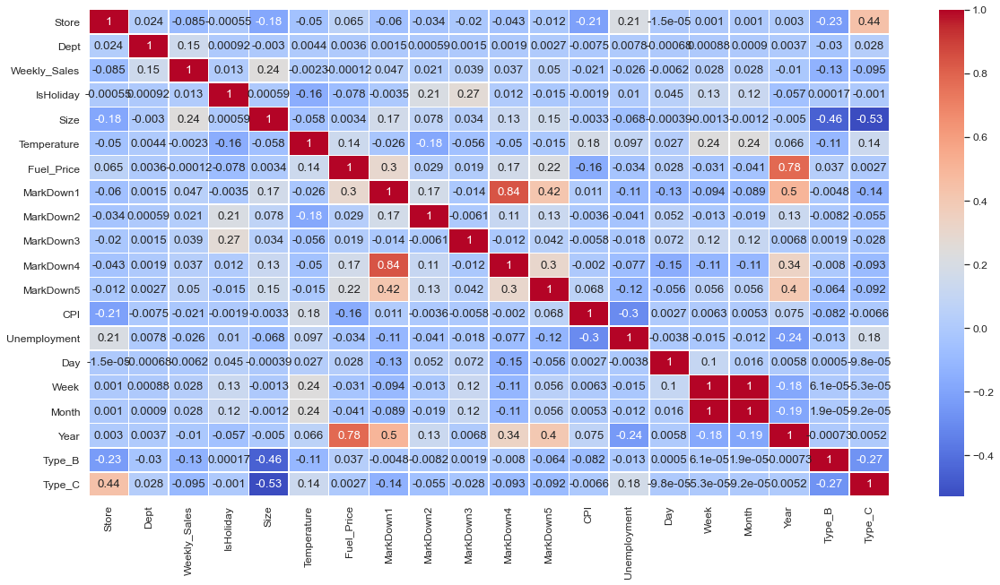

In [56]:
sns.set(rc={'figure.figsize':(20,10)}, font_scale=1.1)
sns.heatmap(train.corr(),linewidths=0.5,annot=True,cmap='coolwarm')

<AxesSubplot:>

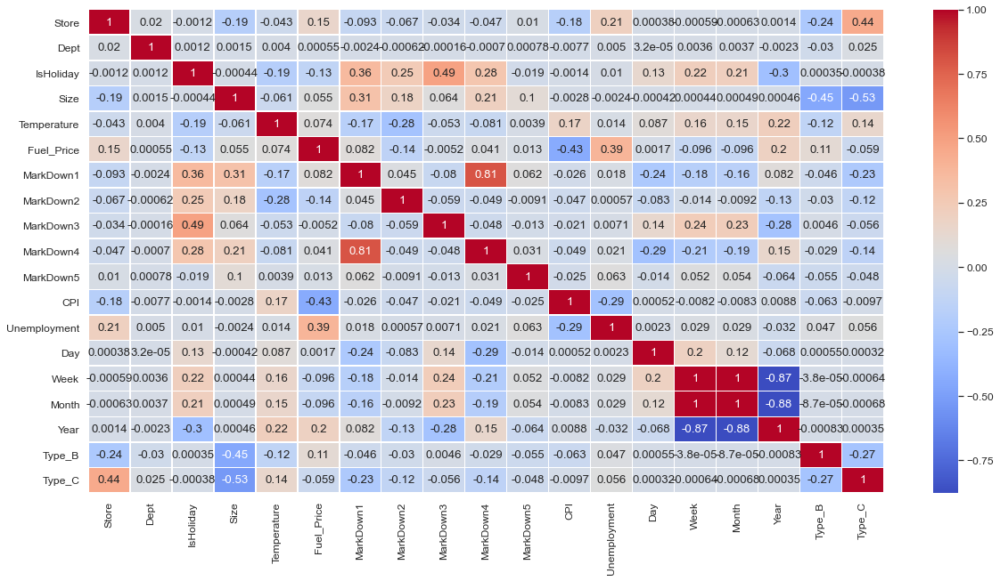

In [57]:
sns.set(rc={'figure.figsize':(20,10)}, font_scale=1.1)
sns.heatmap(test.corr(),linewidths=0.5,annot=True,cmap='coolwarm')

In [60]:
train.columns


Index(['Store', 'Dept', 'Date', 'Weekly_Sales', 'IsHoliday', 'Size',
       'Temperature', 'Fuel_Price', 'MarkDown1', 'MarkDown2', 'MarkDown3',
       'MarkDown4', 'MarkDown5', 'CPI', 'Unemployment', 'Day', 'Week', 'Month',
       'Year', 'Type_B', 'Type_C'],
      dtype='object')

In [63]:
droppcol=['MarkDown1', 'MarkDown5', 'Year' , 'Day', 'Month' , 'CPI'] 
train.drop(droppcol,inplace=True,axis=1)
test.drop(droppcol,inplace=True,axis=1)

In [64]:
# Converting all float var int integer..
for var in train:
    if train[var].dtypes == float:
        train[var]=train[var].astype(int)
        
for var in test:
    if test[var].dtypes == float:
        test[var]=test[var].astype(int)

# Train and Test Definition

In [65]:
#   train X= Exery thing except Weekly_Sales and Date offcourse
train_X=train.drop(['Weekly_Sales','Date'], axis=1)

#  train Y= Only Weekly_Sales 
train_y=train['Weekly_Sales'] 
test_X=test.drop('Date',axis=1).copy()

train_X.shape, train_y.shape, test_X.shape

((421570, 13), (421570,), (115064, 13))

# Building Models

# 1. Linear Regression

In [66]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics

In [67]:
lr = LinearRegression(n_jobs=-1)
lr.fit(train_X,train_y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=-1, normalize=False)

In [68]:
y_pred =lr.predict(test_X)
acc_lm = round(lr.score(train_X,train_y)* 100,2)
print('Accuracy of Linear Regression model: ' +str(acc_lm)+'%')

Accuracy of Linear Regression model: 8.87%


# 2. Random Forest

In [69]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error as mse

In [70]:
#param_grid={'n_estimators':np.arange(20,100)}
#tree=GridSearchCV(RandomForestRegressor(oob_score=False,warm_start=True),param_grid,cv=2,n_jobs=-1)
#tree.fit(train_X,train_y)

In [71]:
clf_rf = RandomForestRegressor(n_estimators=31, n_jobs=-1, verbose=5)
clf_rf.fit(train_X,train_y)
y_pred_rf = clf_rf.predict(test_X)
acc_rf = round(clf_rf.score(train_X,train_y)*100,2)
print('Accuracy of Random Forest model: '+str(acc_rf) +'%')

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.


building tree 1 of 31building tree 2 of 31

building tree 3 of 31
building tree 4 of 31
building tree 5 of 31
building tree 6 of 31
building tree 7 of 31
building tree 8 of 31
building tree 9 of 31
building tree 10 of 31
building tree 11 of 31building tree 12 of 31



[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    5.1s


building tree 13 of 31
building tree 14 of 31
building tree 15 of 31
building tree 16 of 31
building tree 17 of 31
building tree 18 of 31
building tree 19 of 31
building tree 20 of 31
building tree 21 of 31
building tree 22 of 31
building tree 23 of 31
building tree 24 of 31
building tree 25 of 31
building tree 26 of 31
building tree 27 of 31
building tree 28 of 31
building tree 29 of 31
building tree 30 of 31


[Parallel(n_jobs=-1)]: Done  23 out of  31 | elapsed:   16.9s remaining:    5.8s


building tree 31 of 31


[Parallel(n_jobs=-1)]: Done  31 out of  31 | elapsed:   21.3s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=8)]: Done  23 out of  31 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=8)]: Done  31 out of  31 | elapsed:    0.3s finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=8)]: Done  23 out of  31 | elapsed:    0.9s remaining:    0.3s


Accuracy of Random Forest model: 99.63%


[Parallel(n_jobs=8)]: Done  31 out of  31 | elapsed:    1.1s finished


# 3. Decision Tree

In [72]:
from sklearn.tree import DecisionTreeRegressor


In [73]:
reg = DecisionTreeRegressor()
reg.fit(train_X,train_y)
y_pred_dt = reg.predict(test_X)
acc_dt = round(reg.score(train_X,train_y)*100,2)
print("Accuracy of Decision Tree Model: "+str(acc_dt)+'%')

Accuracy of Decision Tree Model: 100.0%


# Comparing Models

In [74]:
models = pd.DataFrame({'Model':['Linear Regression','Random Forest','Decision Tree'],
                      'Score':[acc_lm,acc_rf,acc_dt]})
models.sort_values(by='Score',ascending= False)

,Model,Score
2,Decision Tree,100.00
1,Random Forest,99.63
0,Linear Regression,8.87


# Predicting Weekly Sales value for test data based on DT and RF

In [75]:
#Predicting values
submission = pd.DataFrame({
    'Store_Dept_Date': test.Store.astype(str)+'_'+ test.Dept.astype(str)+'_'+test.Date.astype(str),
    'Weekly_Sales_dt': y_pred_dt , 'Weekly_sales_rf' : y_pred_rf})
submission.to_csv('weekly_sales Predicted.csv',index=False)

In [76]:
submission.head()


,Store_Dept_Date,Weekly_Sales_dt,Weekly_sales_rf
0,1_1_2012-11-02,39886.0,33691.870968
1,1_2_2012-11-02,47313.0,47784.903226
2,1_3_2012-11-02,11676.0,13332.129032
3,1_4_2012-11-02,39549.0,39117.387097
4,1_5_2012-11-02,20920.0,28248.419355
